<a href="https://colab.research.google.com/github/Hanief00/PCVK_GANJIL_2024/blob/main/Modul_11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

* Nama : Hanief Mochsin
* Kelas : TI-3E
* Absen : 15
* NIM : 2241720181

In [1]:
#import library yang dibutuhkan
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

#akses drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


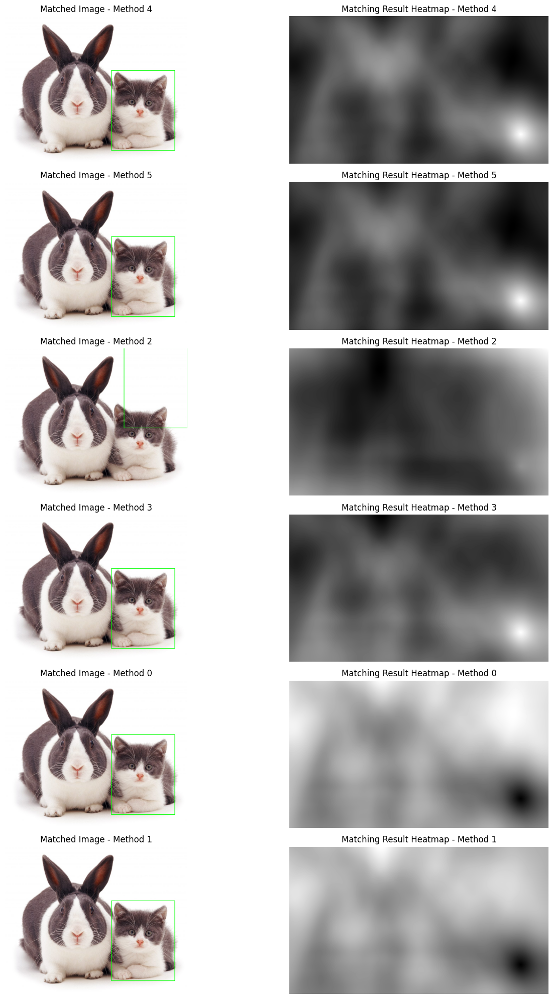

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the main image and template
main_image_path = ('/content/drive/MyDrive/Semester 5/Pengolahan Citra dan Visi Komputer/Modul_11/Object Detection/cats_and_bunnies.jpg')
template_image_path = ('/content/drive/MyDrive/Semester 5/Pengolahan Citra dan Visi Komputer/Modul_11/Object Detection/cat2_templatejpg.jpg')

main_image = cv2.imread(main_image_path, cv2.IMREAD_COLOR)
template_image = cv2.imread(template_image_path, cv2.IMREAD_COLOR)

# Convert to grayscale for template matching
main_gray = cv2.cvtColor(main_image, cv2.COLOR_BGR2GRAY)
template_gray = cv2.cvtColor(template_image, cv2.COLOR_BGR2GRAY)

# Get template dimensions
template_h, template_w = template_gray.shape

# List of methods to test
methods = [
    cv2.TM_CCOEFF,
    cv2.TM_CCOEFF_NORMED,
    cv2.TM_CCORR,
    cv2.TM_CCORR_NORMED,
    cv2.TM_SQDIFF,
    cv2.TM_SQDIFF_NORMED,
]

# Perform template matching for each method
plt.figure(figsize=(15, 20))

for i, method in enumerate(methods):
    # Apply template matching
    result = cv2.matchTemplate(main_gray, template_gray, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

    # For TM_SQDIFF and TM_SQDIFF_NORMED, best match is minimum value
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc

    # Draw rectangle on the original image
    bottom_right = (top_left[0] + template_w, top_left[1] + template_h)
    matched_image = main_image.copy()
    cv2.rectangle(matched_image, top_left, bottom_right, (0, 255, 0), 2)

    # Plot results: Matched Image and Result Heatmap
    plt.subplot(len(methods), 2, 2 * i + 2)
    plt.imshow(result, cmap='gray')
    plt.title(f'Matching Result Heatmap - Method {method}')
    plt.axis('off')

    plt.subplot(len(methods), 2, 2 * i + 1)
    plt.imshow(cv2.cvtColor(matched_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Matched Image - Method {method}')
    plt.axis('off')


plt.tight_layout()
plt.show()


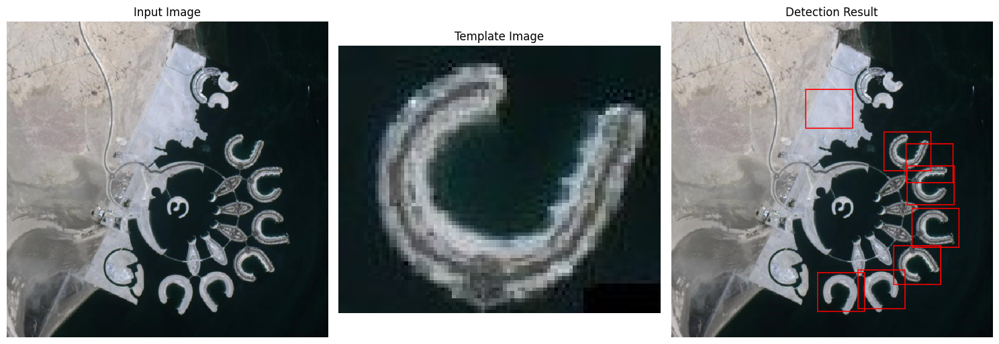

In [3]:
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def load_and_convert_to_grayscale(image_path):
    # Membaca gambar dan mengkonversi ke grayscale
    img = Image.open(image_path).convert('L')
    return np.array(img)

def normalize_cross_correlation(image, template):
    # Menghitung Normalized Cross-Correlation
    ih, iw = image.shape
    th, tw = template.shape

    # Normalisasi template
    template = template - np.mean(template)
    template_std = np.std(template)

    correlations = np.zeros((ih - th + 1, iw - tw + 1))

    for i in range(ih - th + 1):
        for j in range(iw - tw + 1):
            # Mengambil region yang sesuai dengan ukuran template
            window = image[i:i + th, j:j + tw]

            # Normalisasi window
            window = window - np.mean(window)
            window_std = np.std(window)

            # Menghitung correlation
            if window_std > 0 and template_std > 0:
                correlation = np.sum(window * template) / (window_std * template_std * th * tw)
                correlations[i, j] = correlation

    return correlations

def find_matches(correlations, threshold=0.4):
    # Mencari lokasi yang memiliki correlation di atas threshold
    matches = []
    ih, iw = correlations.shape

    # Non-maximum suppression
    for i in range(1, ih-1):
        for j in range(1, iw-1):
            if correlations[i, j] > threshold:
                # Cek apakah ini adalah local maximum
                window = correlations[i-1:i+2, j-1:j+2]
                if correlations[i, j] == np.max(window):
                    matches.append((j, i))

    return matches

def draw_boxes(image_path, matches, template_size):
    # Menggambar kotak pada lokasi yang cocok
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    th, tw = template_size
    for (x, y) in matches:
        draw.rectangle([x, y, x + tw, y + th], outline='red', width=2)

    return image

def detect_objects(input_path, template_path, threshold=0.4):
    # Load gambar
    input_gray = load_and_convert_to_grayscale(input_path)
    template_gray = load_and_convert_to_grayscale(template_path)

    # Hitung correlation
    correlations = normalize_cross_correlation(input_gray, template_gray)

    # Temukan matches
    matches = find_matches(correlations, threshold)

    # Gambar boxes
    result_image = draw_boxes(input_path, matches, template_gray.shape)

    # Tampilkan hasil
    plt.figure(figsize=(15, 5))

    plt.subplot(131)
    plt.title('Input Image')
    plt.imshow(Image.open(input_path))
    plt.axis('off')

    plt.subplot(132)
    plt.title('Template Image')
    plt.imshow(Image.open(template_path))
    plt.axis('off')

    plt.subplot(133)
    plt.title('Detection Result')
    plt.imshow(result_image)
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Jalankan deteksi
input_path = ('/content/drive/MyDrive/Semester 5/Pengolahan Citra dan Visi Komputer/Modul_11/Object Detection/bahrain.jpg')
template_path = ('/content/drive/MyDrive/Semester 5/Pengolahan Citra dan Visi Komputer/Modul_11/Object Detection/bahrain-template.jpg')

detect_objects(input_path, template_path, threshold=0.4)

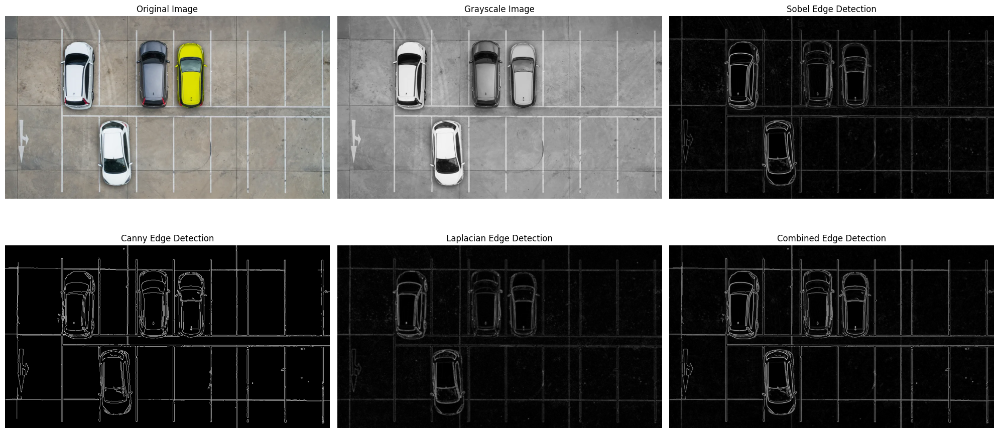

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_edge_detection(image_path):
    # Membaca gambar
    img = cv2.imread(image_path)

    # Konversi ke grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 1. Sobel Edge Detection
    # Compute gradients in x and y directions
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

    # Compute magnitude of gradients
    sobel = np.sqrt(sobelx**2 + sobely**2)
    sobel = np.uint8(sobel * 255 / sobel.max())

    # 2. Canny Edge Detection
    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    canny = cv2.Canny(blurred, 50, 150)

    # 3. Laplacian Edge Detection
    # Apply Gaussian blur first to reduce noise sensitivity
    blurred_laplacian = cv2.GaussianBlur(gray, (3, 3), 0)
    laplacian = cv2.Laplacian(blurred_laplacian, cv2.CV_64F)
    laplacian = np.uint8(np.absolute(laplacian))

    # Plotting results
    plt.figure(figsize=(20, 10))

    # Original Image
    plt.subplot(231)
    plt.title('Original Image')
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    # Grayscale Image
    plt.subplot(232)
    plt.title('Grayscale Image')
    plt.imshow(gray, cmap='gray')
    plt.axis('off')

    # Sobel Edge Detection
    plt.subplot(233)
    plt.title('Sobel Edge Detection')
    plt.imshow(sobel, cmap='gray')
    plt.axis('off')

    # Canny Edge Detection
    plt.subplot(234)
    plt.title('Canny Edge Detection')
    plt.imshow(canny, cmap='gray')
    plt.axis('off')

    # Laplacian Edge Detection
    plt.subplot(235)
    plt.title('Laplacian Edge Detection')
    plt.imshow(laplacian, cmap='gray')
    plt.axis('off')

    # Combined Edge Detection
    combined = cv2.addWeighted(sobel, 1/3, canny, 1/3, 0)
    combined = cv2.addWeighted(combined, 1, laplacian, 1/3, 0)

    plt.subplot(236)
    plt.title('Combined Edge Detection')
    plt.imshow(combined, cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return sobel, canny, laplacian, combined

# Jalankan edge detection
image_path = '/content/drive/MyDrive/Semester 5/Pengolahan Citra dan Visi Komputer/Modul_11/Object Detection/car-park.jpg'
sobel_result, canny_result, laplacian_result, combined_result = apply_edge_detection(image_path)

<ipython-input-5-b9066cc1330a>:19: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


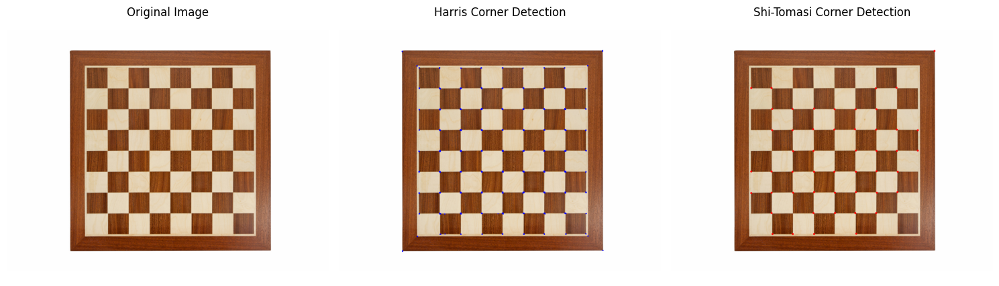

Jumlah corner yang terdeteksi dengan Shi-Tomasi: 50


In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Membaca gambar
img = cv2.imread('/content/drive/MyDrive/Semester 5/Pengolahan Citra dan Visi Komputer/Modul_11/Object Detection/chess-board.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 1. Harris Corner Detection
dst = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)
dst = cv2.dilate(dst, None)

# Membuat salinan gambar untuk Harris Corner
img_harris = img.copy()
img_harris[dst > 0.01 * dst.max()] = [255, 0, 0]  # Menandai corner dengan warna merah

# 2. Shi-Tomasi Corner Detection
corners = cv2.goodFeaturesToTrack(gray, maxCorners=50, qualityLevel=0.01, minDistance=10)
corners = np.int0(corners)

# Membuat salinan gambar untuk Shi-Tomasi
img_shi_tomasi = img.copy()
for corner in corners:
    x, y = corner.ravel()
    cv2.circle(img_shi_tomasi, (x, y), 3, [0, 0, 255], -1)  # Menandai corner dengan lingkaran hijau

# Menampilkan hasil
plt.figure(figsize=(15, 5))

# Harris Corner Detection
plt.subplot(131)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(cv2.cvtColor(img_harris, cv2.COLOR_BGR2RGB))
plt.title('Harris Corner Detection')
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(img_shi_tomasi, cv2.COLOR_BGR2RGB))
plt.title('Shi-Tomasi Corner Detection')
plt.axis('off')

plt.tight_layout()
plt.show()

# Mencetak jumlah corner yang terdeteksi
print(f"Jumlah corner yang terdeteksi dengan Shi-Tomasi: {len(corners)}")

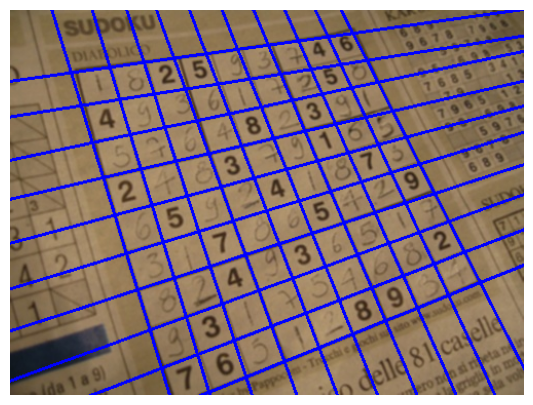

In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Membaca gambar sudoku
sudoku_image_path = ('/content/drive/MyDrive/Semester 5/Pengolahan Citra dan Visi Komputer/Modul_11/Object Detection/sudoku.jpg')
sudoku_img = cv.imread(sudoku_image_path)
assert sudoku_img is not None, "File tidak ditemukan!"

# Mengonversi gambar menjadi grayscale
gray_img = cv.cvtColor(sudoku_img, cv.COLOR_BGR2GRAY)

# Menggunakan deteksi tepi Canny
edges_detected = cv.Canny(gray_img, 90, 150, apertureSize=3)

# Menghubungkan komponen yang terputus dengan dilasi
dilated_edges = cv.dilate(edges_detected, np.ones((3, 3), np.uint8), iterations=1)

# Menghilangkan noise dengan erosi
eroded_edges = cv.erode(dilated_edges, np.ones((5, 5), np.uint8), iterations=1)

# Menerapkan Hough Transform untuk mendeteksi garis
detected_lines = cv.HoughLines(eroded_edges, 1, np.pi / 180, 150)

# Memeriksa apakah ada garis yang ditemukan
if detected_lines is None:
    print('No lines were found')
    exit()

# Filter garis sejajar atau berdekatan
if filter:
    rho_threshold = 15
    theta_threshold = 0.1

    similar_lines_dict = {i: [] for i in range(len(detected_lines))}

    for i in range(len(detected_lines)):
        for j in range(len(detected_lines)):
            if i != j:
                rho_i, theta_i = detected_lines[i][0]
                rho_j, theta_j = detected_lines[j][0]
                if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                    similar_lines_dict[i].append(j)

    line_indices = list(range(len(detected_lines)))
    line_indices.sort(key=lambda x: len(similar_lines_dict[x]))

    line_flags = [True] * len(detected_lines)

    for i in range(len(detected_lines) - 1):
        if not line_flags[line_indices[i]]:
            continue

        for j in range(i + 1, len(detected_lines)):
            if not line_flags[line_indices[j]]:
                continue
            rho_i, theta_i = detected_lines[line_indices[i]][0]
            rho_j, theta_j = detected_lines[line_indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags[line_indices[j]] = False

    filtered_lines_list = [detected_lines[i] for i in range(len(detected_lines)) if line_flags[i]] if filter else detected_lines

    # Menggambar garis yang telah difilter pada gambar
    for line in filtered_lines_list:
        rho, theta = line[0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))

        cv.line(sudoku_img, (x1, y1), (x2, y2), (255, 0, 0), 2)

    # Menampilkan gambar input dengan garis yang telah difilter
    plt.figure(figsize=(10, 5))
    plt.imshow(cv.cvtColor(sudoku_img, cv.COLOR_BGR2RGB))
    plt.axis('off')  # Menyembunyikan sumbu
    plt.show()

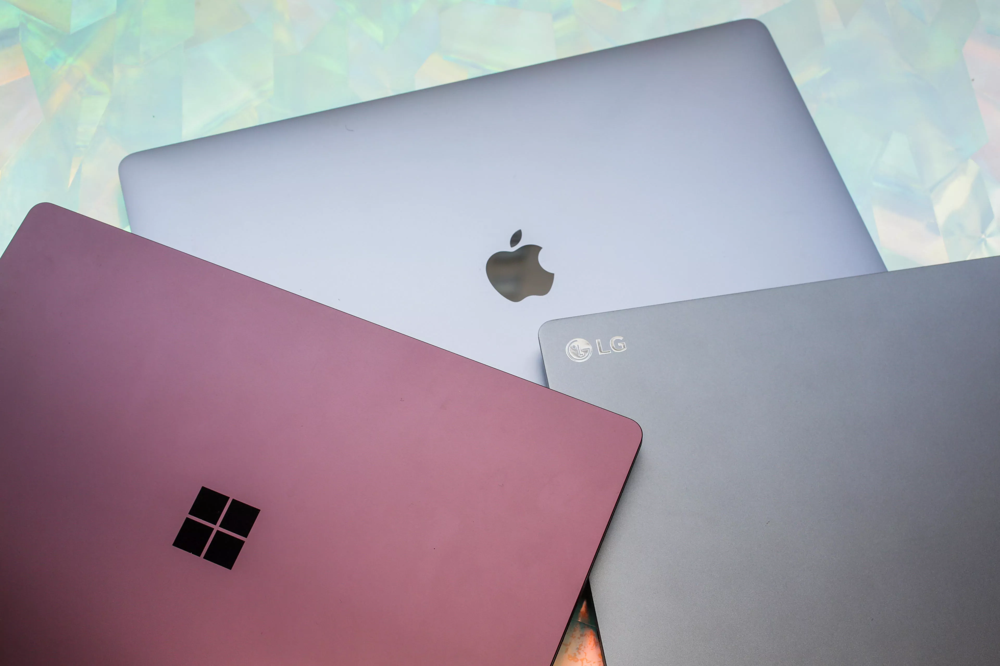

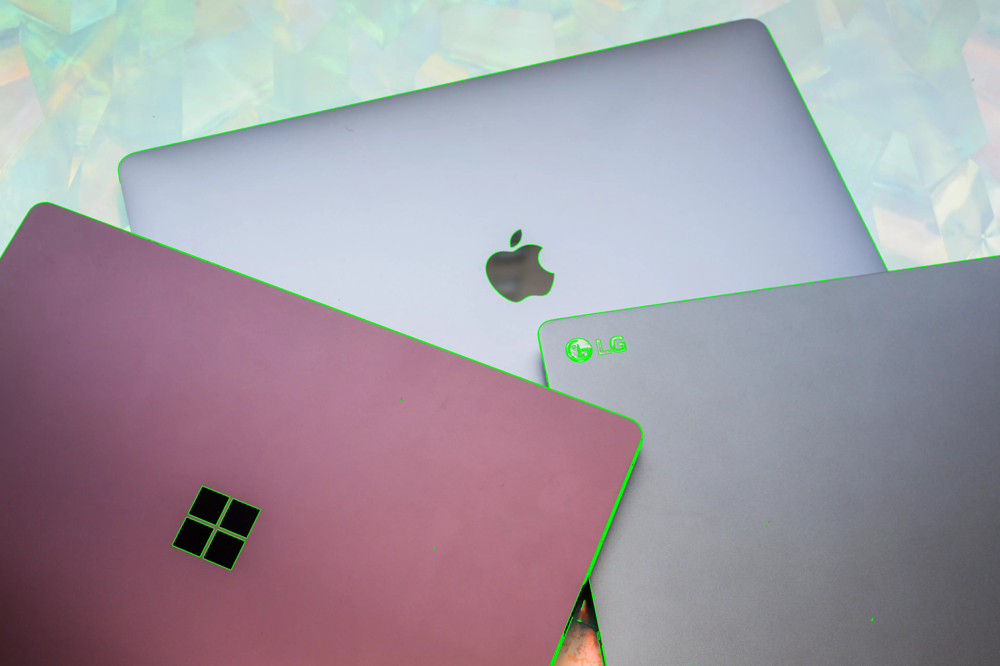

In [7]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
# Langkah 1: Baca gambar
image_path = '/content/drive/MyDrive/Semester 5/Pengolahan Citra dan Visi Komputer/Modul_11/Object Detection/laptop.jpg'
image = cv2.imread(image_path)

# Langkah 2: Konversi ke grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Langkah 3: Terapkan Canny edge detection
edges = cv2.Canny(gray, 100, 200)

# Langkah 4: Temukan kontur
contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Langkah 5: Gambar kontur
contour_image = image.copy()
cv2.drawContours(contour_image, contours, -1, (0, 255, 0), 2)  # Gambar semua kontur dengan warna hijau

# Tampilkan gambar asli dan gambar dengan kontur
cv2_imshow(image)
cv2_imshow(contour_image)


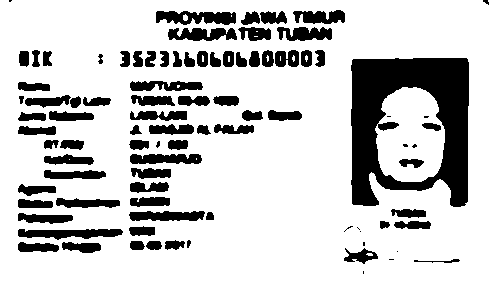

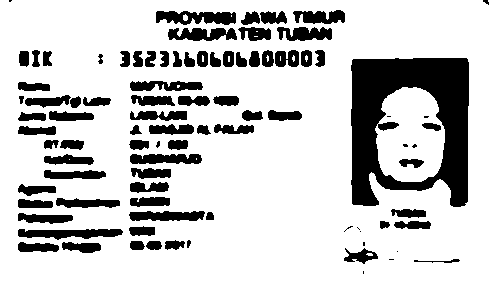

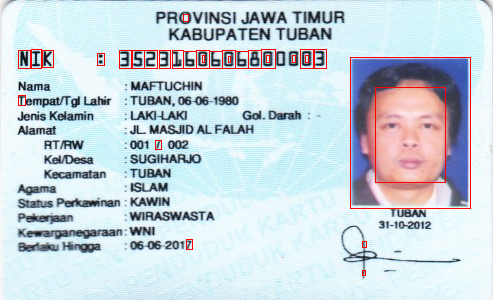

In [18]:
import cv2
import glob
from google.colab.patches import cv2_imshow

# Path to the image
path_plate = '/content/drive/MyDrive/Semester 5/Pengolahan Citra dan Visi Komputer/Modul_11/Object Detection/KTP_More/ktp4.png'

# Iterate through the file (single file in this case)
image_files = glob.glob(path_plate)
for image_path in image_files:
    # Read the image
    image = cv2.imread(image_path)

    # Create a blurred version with multiple iterations
    blurred_image = image.copy()
    for _ in range(10):  # Apply Gaussian Blur 10 times
        blurred_image = cv2.GaussianBlur(blurred_image, (5, 5), 0.5)

    # Convert the image to grayscale
    grayscale = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2GRAY)

    # Apply thresholding (Otsu's method included)
    _, binary_image = cv2.threshold(grayscale, 100, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Perform erosion with a structuring element
    eroded_image = cv2.erode(binary_image, cv2.getStructuringElement(cv2.MORPH_RECT, (1, 1)))

    # Find contours from the eroded image
    contours, _ = cv2.findContours(eroded_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    # Loop through the contours to draw rectangles for valid regions
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        aspect_ratio = w / h  # Calculate the aspect ratio

        # Filter based on size and aspect ratio
        if h >= 5 and w >= 2 and aspect_ratio <= 0.8:
            cv2.rectangle(image, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

    # Display the processed images
    cv2_imshow(binary_image)
    cv2_imshow(eroded_image)
    cv2_imshow(image)


**TUGAS KELOMPOK 5**

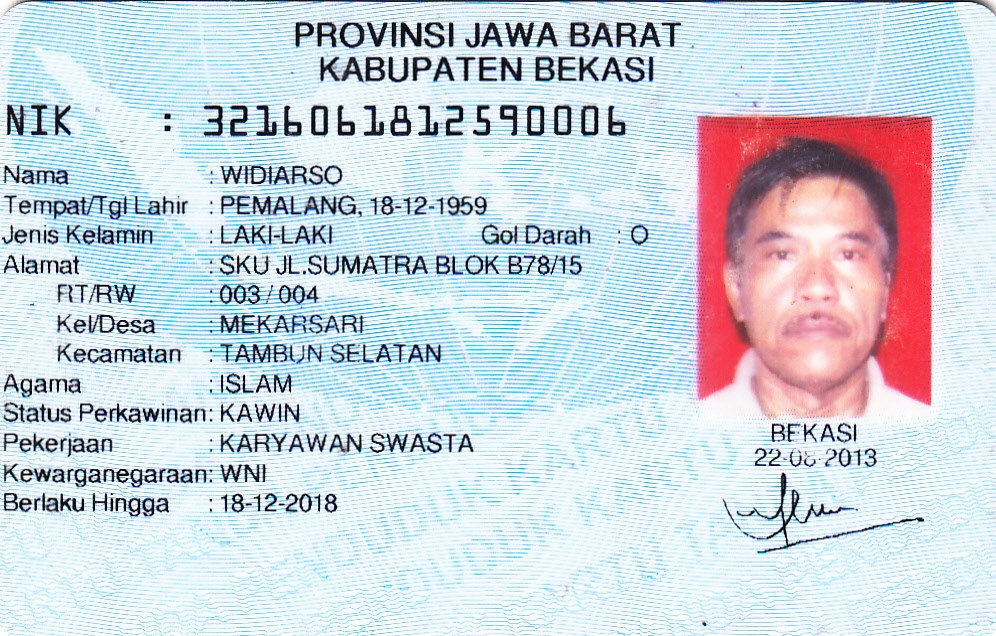

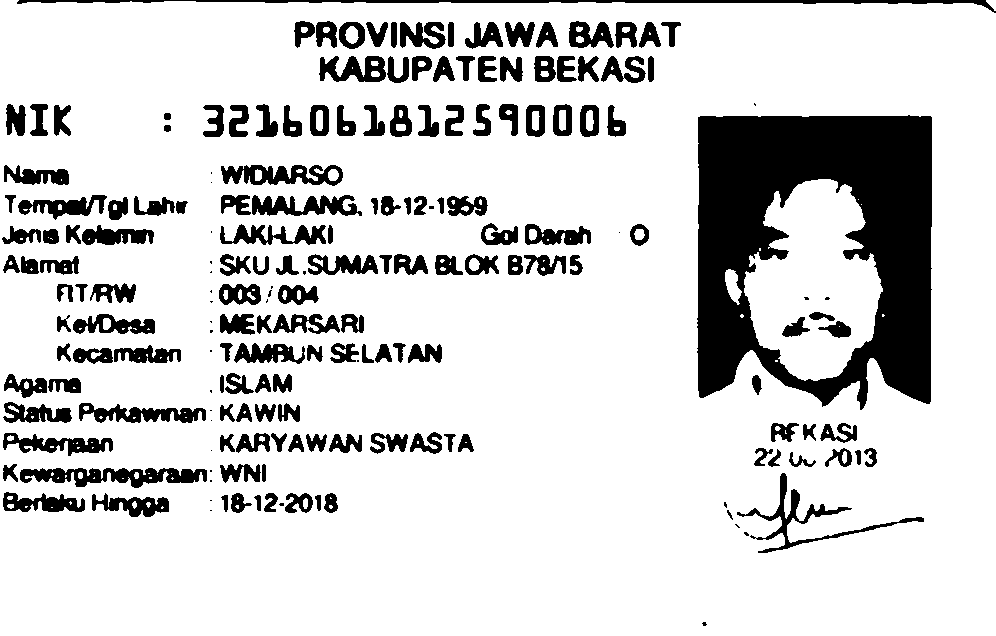

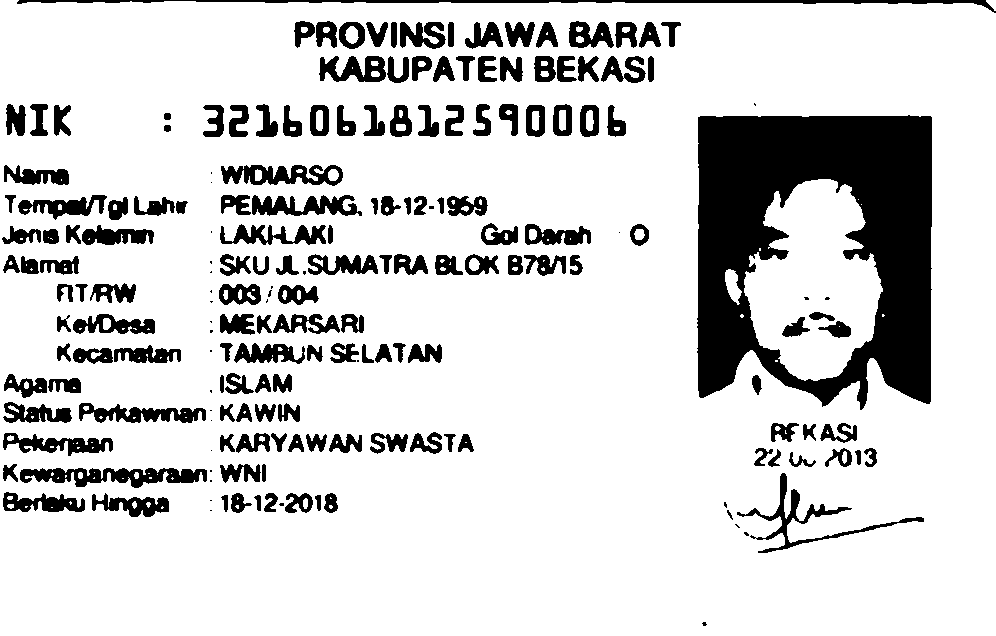

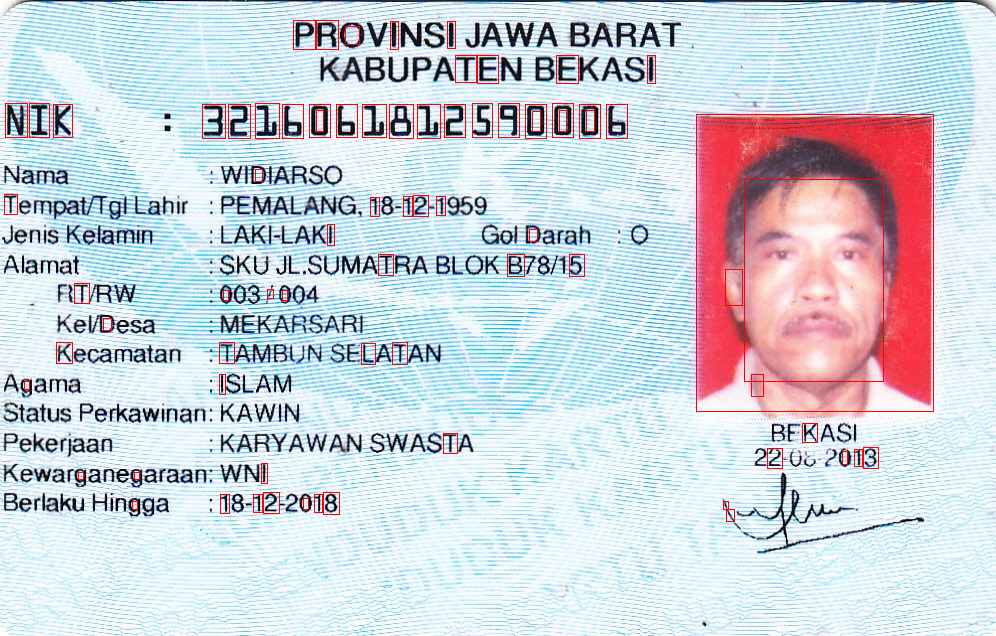

In [19]:
import cv2
from google.colab.patches import cv2_imshow

# Load the image
image_path = '/content/drive/MyDrive/Semester 5/Pengolahan Citra dan Visi Komputer/Modul_11/Object Detection/KTP_More/ktp6.png'
ktp_image = cv2.imread(image_path)
cv2_imshow(ktp_image)

# Apply Gaussian Blur iteratively
smoothed_image = ktp_image.copy()
for _ in range(10):  # Smoothen the image multiple times
    smoothed_image = cv2.GaussianBlur(smoothed_image, (5, 5), 0.5)

# Convert the image to grayscale
gray_image = cv2.cvtColor(smoothed_image, cv2.COLOR_BGR2GRAY)

# Perform thresholding using Otsu's method
_, binary_image = cv2.threshold(gray_image, 100, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Apply morphological erosion
structuring_element = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 1))
eroded_image = cv2.erode(binary_image, structuring_element)

# Extract contours
found_contours, _ = cv2.findContours(eroded_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Filter contours and draw rectangles for valid regions
for contour in found_contours:
    x, y, width, height = cv2.boundingRect(contour)
    aspect_ratio = width / height

    # Filter based on size and aspect ratio
    if height >= 5 and width >= 5 and aspect_ratio <= 0.8:
        cv2.rectangle(ktp_image, (x, y), (x + width, y + height), (0, 0, 255), thickness=1)

# Display the processed images
cv2_imshow(binary_image)
cv2_imshow(eroded_image)
cv2_imshow(ktp_image)
